# Курс Спортивный анализ данных. Платформа Kaggle

# Практическое задание урока 6. Feature Engineering, Feature Selection, part II

Продолжим работу с данными, которые были использованы ранее, возмьмем за основу набор данных с дополнительными признаками, которые были созданы в предыдущем задании (оставить все признаки, вне зависимости от того, добавляют они качества или нет).

Задание 0: выбрать любимую модель и схему валидации решения, зафиксировать базовое качество модели.

Задание 1: использовать внутренний способ для оценки важности признаков алгоритма, вывести его в виде диаграммы.

Задание 2: удалить признаки с нулевой или маленькой важностью, переобучить модель и оценить изменение качества.

Задание 3: использовать permutation importance, выполнить задание 1 и 2.

Задание 4: использовать BoostARoota для отбора признаков (настраивать или нет - на ваше усмотрение), переобучить модель и оценить изменение качества.

Задание 5: использовать shap, выполнить задание 1 и 2.

Задание 6: построить shap.summary_plot и shap.decision_plot для небольшой группы примеров (определить размер самостоятельно) и проанализировать влияние признаков на поведение модели.

## Подключение библиотек и скриптов

In [1]:
import time
import numpy as np
import pandas as pd
from tqdm import tqdm
from scipy.stats import rankdata
from scipy.stats.mstats import winsorize

from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import KFold
from sklearn.inspection import permutation_importance
import catboost as cb

from pathlib import Path
import math
import itertools

import shap

import matplotlib
import matplotlib.image as img
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

pd.set_option("max.columns", None)
#warnings.simplefilter("ignore")
shap.initjs()

In [2]:
def create_features(X, copy: bool = True):
    """
    Создание дополнительных признаков на основе исходных признаков.

    Parameters
    ----------
    X: pandas.core.frame.XFrame
        Матрица исходных признаков.

    copy: bool, optional, default = True
        Флаг использования копии датафрейма X.
        Опциональный параметр, по умолчанию, равен True.

    Returns
    -------
    X_transformed: pandas.core.frame.XFrame
        Расширенная матрица признаков с дополнительными признаками.
        
    CAT_FEATS: str
        Список названий категориальных признаков.

    """
    if copy:
        X = X.copy()
    
    # Преобразовать признак TransactionDT в datetime, прибавив к базовой дате исходное значение признака
    # Из преобразованного признака TransactionDT выделить год, месяц, день недели, час, день
    DATE = 'TransactionDT'
    base_date = pd.to_datetime('2017-12-01')
    X[DATE] = pd.to_datetime(X[DATE], unit='s', origin=base_date)
    X[DATE + '_Year'] = X[DATE].dt.year
    X[DATE + '_Month'] = X[DATE].dt.month
    X[DATE + '_WeekDay'] = X[DATE].dt.weekday  # день недели как целое число, где понедельник — 0, а воскресенье — 6
    X[DATE + '_Hour'] = X[DATE].dt.hour
    X[DATE + '_Day'] = X[DATE].dt.day  # От 1 до количества дней в данном месяце данного года
    X[DATE] = (X[DATE].astype('int64') / 10**9).astype('int64') # Обратное преобразование признака TransactionDT в timestamp
    
    # Сделать конкатенацию признаков, рассматривая их как категориальные
    features_1 = ['card1', 'card2', 'card3', 'card5', 'addr1', 'addr2']
    
    for feature in features_1:
        X[feature] = X[feature].astype('str')
    
    X["card1_card2"] = X['card1'] + " | " + X['card2']
    X["card1_card2_card3_card5"] = X['card1_card2'] + " | " + X['card3'] + " | " + X['card5']
    X["card1_card2_card3_card5_addr1_addr2"] = X['card1_card2_card3_card5'] + " | " +  X['addr1'] + " | " + X['addr2']
    
    CAT_FEATS = X.dtypes[X.dtypes=="object"].index.tolist()  # Categorical
    
    # Сделать FrequencyEncoder для признаков card1 - card6, addr1, addr2
    features_2 = ['card1', 'card2', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2']

    for feature in features_2:
        freq_enc = X[feature].value_counts(normalize=True)
        X[feature + "_freq_enc"] = X[feature].map(freq_enc)
    
    # Создать признаки на основе отношения: TransactionAmt к вычисленной статистике
    # Создать признаки на основе отношения: D15 к вычисленной статистике
    new_features = ["card1_card2", "card1_card2_card3_card5", "card1_card2_card3_card5_addr1_addr2"]
    features_3 = features_2 + new_features    
    
    params = {'value_col': ["TransactionAmt", "D15"],
              'feature': features_3}

    for value_col, feature in itertools.product(*params.values()):
        value_col_mean_by_feature = X.groupby(feature, as_index=False)[value_col].mean()
        group_feat_name = value_col + "_mean_by_" + feature
        value_col_mean_by_feature = value_col_mean_by_feature.rename(columns={value_col: group_feat_name})
        X = X.merge(value_col_mean_by_feature, how="left", on=feature)
        X[value_col + "_per_" + group_feat_name] = X[value_col] / X[group_feat_name]
        X = X.drop(group_feat_name, axis=1)
    
    
    # Выделить дробную часть и целую часть признака TransactionAmt в два отдельных признака
    # После создать отдельных признак - логарифм от TransactionAmt
    value_col = "TransactionAmt"
    X['IntegerPart_of_' + value_col] = X[value_col].apply(lambda x: math.modf(x)[1])
    X['FractionalPart_of_' + value_col] = X[value_col].apply(lambda x: math.modf(x)[0])
    X['Logarithm_of_' + value_col] = np.log(X[value_col])
    
    return X, CAT_FEATS

In [3]:
def catboost_hold_out_validation(params, X, y, split_params = [0.7, 0.2, 0.1], categorical = None, seed = 42):
    """
    Hold-Out валидация для модели catbooost.

    Parameters
    ----------
    params: dict
        Словарь гиперпараметров модели.

    X: pandas.core.frame.DataFrame
        Матрица признако для обучения модели.

    y: pandas.core.frame.Series
        Вектор целевой переменной для обучения модели.

    split_params: List[float], optional, default = [0.7, 0.2, 0.1]
        Параметры (доли) разбиения выборки.
        Опциональный параметр, по умолчанию, равен [0.7, 0.2, 0.1].

    categorical: str, optional, default = None
        Список категориальных признаков.
        Опциональный параметр, по умолчанию, не используется.

    Returns
    -------
    estimator: catboost.core.CatBoostClassifier
        Обученный классификатор catboost.

    test_prediction: np.array, optional
        Вектор прогнозов для тестовой выборки.
        Опциональный объект, возвращается только, если split_params
        содержит 3 значения.

    """
    if categorical is not None:
        X[categorical] = X[categorical].astype(str)

    numeric = list(set(X.columns) - set(categorical))
    x_train, x_valid = train_test_split(
        X, train_size=split_params[0], random_state=seed
    )
    y_train, y_valid = train_test_split(
        y, train_size=split_params[0], random_state=seed
    )

    if len(split_params) == 3:
        test_size = int(split_params[2] * X.shape[0])

        x_valid, x_test = train_test_split(
            x_valid, test_size=test_size, random_state=seed
        )
        y_valid, y_test = train_test_split(
            y_valid, test_size=test_size, random_state=seed
        )

    estimator = cb.CatBoostClassifier(**params)
    estimator.fit(
        x_train, y_train, categorical,
        eval_set=[(x_train, y_train), (x_valid, y_valid)]
    )

    print("="*80)
    train_score = roc_auc_score(y_train, estimator.predict_proba(x_train)[:, 1])
    print(f"Train Score = {round(train_score, 4)}")
    valid_score = roc_auc_score(y_valid, estimator.predict_proba(x_valid)[:, 1])
    print(f"Valid Score = {round(valid_score, 4)}")

    if len(split_params) == 3:

        test_prediction = estimator.predict_proba(x_test)[:, 1]
        test_score = roc_auc_score(y_test, test_prediction)
        print(f"Test Score = {round(test_score, 4)}")

        return estimator, test_prediction, x_valid, y_valid  # для permutation importance добавлены в вывод x_valid, y_valid

    else:
        return estimator, x_valid, y_valid  # для permutation importance добавлены в вывод x_valid, y_valid 

In [96]:
def catboost_cross_validation(params, X, y, cv,
                                categorical = None):
    """
    Кросс-валидация для модели catbooost.

    Parameters
    ----------
    params: dict
        Словарь гиперпараметров модели.

    X: pandas.core.frame.DataFrame
        Матрица признако для обучения модели.

    y: pandas.core.frame.Series
        Вектор целевой переменной для обучения модели.

    cv: KFold or StratifiedKFold generator.
        Объект KFold / StratifiedKFold для определения
        стратегии кросс-валидации модели.

    categorical: str, optional, default = None
        Список категориальных признаков.
        Опциональный параметр, по умолчанию, не используется.

    Returns
    -------
    estimators: list
        Список с объектами обученной модели.

    oof_preds: np.array
        Вектор OOF-прогнозов.

    """
    estimators, folds_scores = [], []
    oof_preds = np.zeros(X.shape[0])

    print(f"{time.ctime()}, Cross-Validation, {X.shape[0]} rows, {X.shape[1]} cols")
    if categorical:
        categorical = list(set(categorical) & set(X.columns))
        X[categorical] = X[categorical].astype(str)

    for fold, (train_idx, valid_idx) in enumerate(cv.split(X, y)):

        x_train, x_valid = X.loc[train_idx], X.loc[valid_idx]
        y_train, y_valid = y[train_idx], y[valid_idx]

        model = cb.CatBoostClassifier(**params)
        model.fit(
            x_train, y_train, categorical,
            eval_set=[(x_train, y_train), (x_valid, y_valid)]
        )
        oof_preds[valid_idx] = model.predict_proba(x_valid)[:, 1]
        score = roc_auc_score(y_valid, oof_preds[valid_idx])
        print(f"Fold {fold+1}, Valid score = {round(score, 5)}")
        folds_scores.append(round(score, 5))
        estimators.append(model)

    print(f"Score by each fold: {folds_scores}")
    print("="*65)
    print(f"CV-results valid: {round(np.mean(folds_scores), 5)} +/- {round(np.std(folds_scores), 4)}")
        
    return estimators, oof_preds

In [5]:
def get_input(dataset_path: str) -> pd.DataFrame:
    """
    Считывание данных и вывод основной информации о наборе данных.
    
    Parametrs
    ---------
    dataset_path: str
        Название файла
        
    Returns
    -------
    data: pandas.core.frame.DataFrame
        Загруженный набор данных в pandas.DataFrame
    """
    
    data_root = Path('D:/DS_materials/208_kaggle/data/')
    dataset = pd.read_csv(f'{data_root}/{dataset_path}')
    
    print(f"{dataset_path} shape: {dataset.shape[0]} rows, {dataset.shape[1]} cols")

    return dataset

## Загрузка данных

In [6]:
train = get_input("assignment_2_train.csv")
# test = get_input("assignment_2_test.csv")

assignment_2_train.csv shape: 180000 rows, 394 cols


## Подготовка данных

In [88]:
train, CAT_FEATS = create_features(train)
print(f"Categorical Features Count: {len(CAT_FEATS)}")

Categorical Features Count: 23


In [8]:
train.head(2)

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,TransactionDT_Year,TransactionDT_Month,TransactionDT_WeekDay,TransactionDT_Hour,TransactionDT_Day,card1_card2,card1_card2_card3_card5,card1_card2_card3_card5_addr1_addr2,card1_freq_enc,card2_freq_enc,card3_freq_enc,card4_freq_enc,card5_freq_enc,card6_freq_enc,addr1_freq_enc,addr2_freq_enc,TransactionAmt_per_TransactionAmt_mean_by_card1,TransactionAmt_per_TransactionAmt_mean_by_card2,TransactionAmt_per_TransactionAmt_mean_by_card3,TransactionAmt_per_TransactionAmt_mean_by_card4,TransactionAmt_per_TransactionAmt_mean_by_card5,TransactionAmt_per_TransactionAmt_mean_by_card6,TransactionAmt_per_TransactionAmt_mean_by_addr1,TransactionAmt_per_TransactionAmt_mean_by_addr2,TransactionAmt_per_TransactionAmt_mean_by_card1_card2,TransactionAmt_per_TransactionAmt_mean_by_card1_card2_card3_card5,TransactionAmt_per_TransactionAmt_mean_by_card1_card2_card3_card5_addr1_addr2,D15_per_D15_mean_by_card1,D15_per_D15_mean_by_card2,D15_per_D15_mean_by_card3,D15_per_D15_mean_by_card4,D15_per_D15_mean_by_card5,D15_per_D15_mean_by_card6,D15_per_D15_mean_by_addr1,D15_per_D15_mean_by_addr2,D15_per_D15_mean_by_card1_card2,D15_per_D15_mean_by_card1_card2_card3_card5,D15_per_D15_mean_by_card1_card2_card3_card5_addr1_addr2,IntegerPart_of_TransactionAmt,FractionalPart_of_TransactionAmt,Logarithm_of_TransactionAmt
0,2987000,0,1512172800,68.5,W,13926,nan,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,F,T,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [9]:
ID = 'TransactionID'
TARGET = 'isFraud'

## Задание 0: 

* выбрать любимую модель и схему валидации решения, зафиксировать базовое качество модели.

**Baseline model**

In [10]:
seed = 42
np.random.seed(seed)

params_cb = {
    "n_estimators": 2000,
    "loss_function": "Logloss",
    "eval_metric": "AUC",
    "task_type": "CPU",
    "max_bin": 20,
    "verbose": 100,
    "max_depth": 6,
    "l2_leaf_reg": 100,
    "early_stopping_rounds": 50,
    "thread_count": 6,
    "random_seed": seed
}

In [89]:
X = train.drop([TARGET, ID], axis=1)
y = train[TARGET]

In [11]:
%%time

X = train.drop([TARGET, ID], axis=1)
y = train[TARGET]

model_cb_0, X_valid, y_valid = catboost_hold_out_validation(params=params_cb,
                                                        X=X,
                                                        y=y,
                                                        split_params =[0.7, 0.3],
                                                        categorical = CAT_FEATS,
                                                        seed=seed)

0:	test: 0.6444120	test1: 0.6354049	best: 0.6354049 (0)	total: 1.71s	remaining: 57m 2s
100:	test: 0.9569611	test1: 0.9123357	best: 0.9123357 (100)	total: 1m 44s	remaining: 32m 49s
200:	test: 0.9707484	test1: 0.9276505	best: 0.9276505 (200)	total: 3m 13s	remaining: 28m 52s
300:	test: 0.9771711	test1: 0.9372320	best: 0.9372320 (300)	total: 4m 47s	remaining: 27m 5s
400:	test: 0.9789277	test1: 0.9406046	best: 0.9406046 (400)	total: 6m 20s	remaining: 25m 15s
500:	test: 0.9798825	test1: 0.9416740	best: 0.9416740 (500)	total: 7m 49s	remaining: 23m 25s
600:	test: 0.9813422	test1: 0.9433232	best: 0.9433232 (600)	total: 9m 23s	remaining: 21m 51s
700:	test: 0.9814747	test1: 0.9437096	best: 0.9437122 (687)	total: 10m 54s	remaining: 20m 13s
800:	test: 0.9819349	test1: 0.9442929	best: 0.9442934 (798)	total: 12m 32s	remaining: 18m 46s
900:	test: 0.9825840	test1: 0.9452104	best: 0.9452104 (900)	total: 14m 10s	remaining: 17m 17s
1000:	test: 0.9826367	test1: 0.9453783	best: 0.9453783 (1000)	total: 15m 4

In [98]:
# Расчет метрики ROC_AUC на кросс-валидации по 5 фолдам
cv = KFold(n_splits=5, random_state=1234123, shuffle=True)

estimators, oof_preds = catboost_cross_validation(
    params=params_cb, X=X, y=y, cv=cv, categorical=CAT_FEATS
)

Tue Oct 26 20:25:54 2021, Cross-Validation, 180000 rows, 433 cols
0:	test: 0.6129632	test1: 0.6059176	best: 0.6059176 (0)	total: 807ms	remaining: 26m 52s
100:	test: 0.9579107	test1: 0.9152711	best: 0.9152711 (100)	total: 1m 50s	remaining: 34m 30s
200:	test: 0.9674355	test1: 0.9275281	best: 0.9275281 (200)	total: 3m 40s	remaining: 32m 55s
300:	test: 0.9752730	test1: 0.9379421	best: 0.9379431 (299)	total: 5m 36s	remaining: 31m 37s
400:	test: 0.9777558	test1: 0.9413312	best: 0.9413312 (400)	total: 7m 24s	remaining: 29m 31s
500:	test: 0.9782344	test1: 0.9421313	best: 0.9421313 (500)	total: 9m 8s	remaining: 27m 22s
600:	test: 0.9796604	test1: 0.9439233	best: 0.9439233 (600)	total: 10m 58s	remaining: 25m 32s
700:	test: 0.9801440	test1: 0.9446674	best: 0.9446688 (699)	total: 12m 46s	remaining: 23m 39s
800:	test: 0.9801788	test1: 0.9448194	best: 0.9448194 (799)	total: 14m 28s	remaining: 21m 39s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.9448299766
bestIteration = 827



**Итого:** 
* Базовое качество модели на валидационной выборке 0.9471, при кросс-валидации на 5 фолдах 0.9477

## Задание 1:

* использовать внутренний способ для оценки важности признаков алгоритма, вывести его в виде диаграммы.

**Веса признаков**

In [13]:
pd.set_option("max.rows", None)

feature_importances = pd.DataFrame(
    zip(X.columns, model_cb_0.get_feature_importance()),
    columns=['feature_name', 'importance']
)

feature_importances.sort_values(by='importance', ascending=False, inplace=True)

z = feature_importances[feature_importances["importance"]!=0]
s = feature_importances[feature_importances["importance"]>=0.06]
print(f"Total Features Count: {len(feature_importances)}")
print(f"Importance Features Count if importance !=0: {len(z)}")
print(f"Importance Features Count if importance >= 0.06: {len(s)}")
feature_importances[feature_importances["importance"]>=0.06]

Total Features Count: 433
Importance Features Count if importance !=0: 353
Importance Features Count if importance >= 0.06: 180


,feature_name,importance
399,card1_card2_card3_card5_addr1_addr2,12.348835
13,P_emaildomain,5.235666
27,C13,5.150287
28,C14,4.429934
48,M5,3.551842
15,C1,3.495031
2,ProductCD,2.237374
0,TransactionDT,2.225513
25,C11,1.804448
431,FractionalPart_of_TransactionAmt,1.729728


**Диаграмма важности признаков**

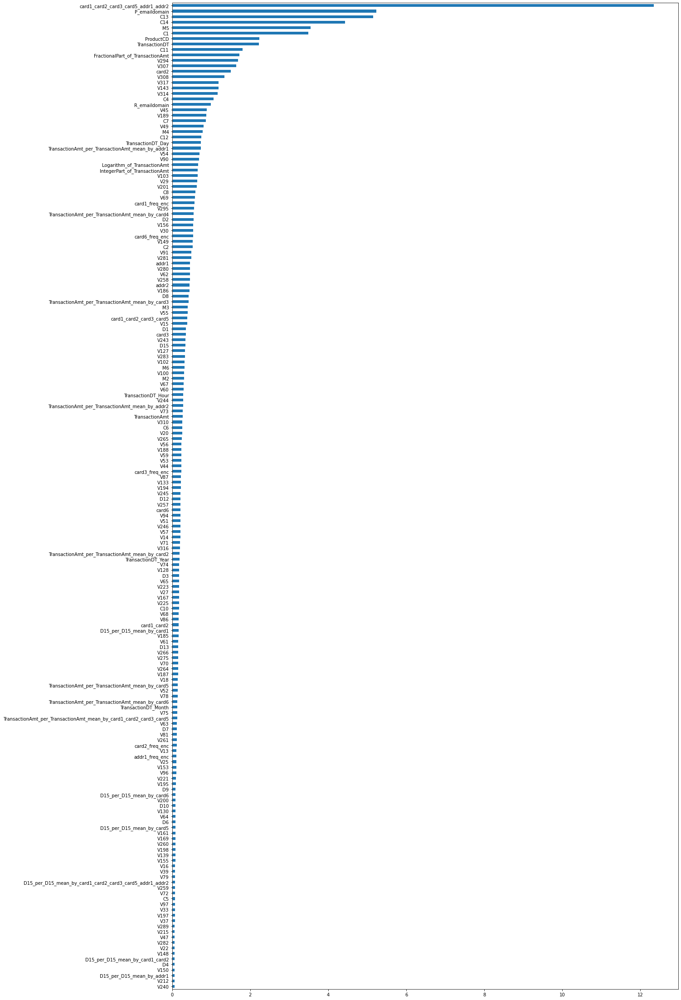

In [14]:
importances = model_cb_0.get_feature_importance()
feat_importances = pd.Series(importances, index=X.columns)
feat_importances.sort_values(ascending=True, inplace=True)
feat_importances[-180:].plot(kind='barh', figsize=(20, 40));

## Задание 2: 

* удалить признаки с нулевой или маленькой важностью, переобучить модель и оценить изменение качества.

**Модель на 180 важных признаках**

In [15]:
IMPORTANCE_FEATS = feat_importances[-180:].index.tolist()

In [16]:
train[IMPORTANCE_FEATS].shape

(180000, 180)

In [17]:
CAT_FEATS = train[IMPORTANCE_FEATS].dtypes[train[IMPORTANCE_FEATS].dtypes=="object"].index.tolist()
print(f"Categorical Features Count: {len(CAT_FEATS)}")

Categorical Features Count: 16


In [18]:
model_cb_2 = catboost_hold_out_validation(params=params_cb,
                                                        X=train[IMPORTANCE_FEATS],
                                                        y=y,
                                                        split_params =[0.7, 0.3],
                                                        categorical = CAT_FEATS,
                                                        seed=seed)


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0:	test: 0.6007541	test1: 0.5760942	best: 0.5760942 (0)	total: 944ms	remaining: 31m 27s
100:	test: 0.9643893	test1: 0.9204913	best: 0.9204913 (100)	total: 1m 8s	remaining: 21m 29s
200:	test: 0.9760077	test1: 0.9349440	best: 0.9349440 (200)	total: 2m 16s	remaining: 20m 21s
300:	test: 0.9805232	test1: 0.9414123	best: 0.9414123 (300)	total: 3m 26s	remaining: 19m 23s
400:	test: 0.9818216	test1: 0.9436901	best: 0.9436950 (397)	total: 4m 34s	remaining: 18m 12s
500:	test: 0.9823633	test1: 0.9444135	best: 0.9444135 (500)	total: 5m 41s	remaining: 17m 1s
600:	test: 0.9830940	test1: 0.9455043	best: 0.9455043 (600)	total: 6m 48s	remaining: 15m 51s
700:	test: 0.9835026	test1: 0.9461803	best: 0.9462025 (694)	total: 7m 54s	remaining: 14m 40s
800:	test: 0.9837727	test1: 0.9465550	best: 0.9465561 (799)	total: 9m	remaining: 13m 29s
900:	test: 0.9843395	test1: 0.9471750	best: 0.9471750 (900)	total: 10m 7s	remaining: 12m 20s
1000:	test: 0.9846142	test1: 0.9476175	best: 0.9476176 (998)	total: 11m 11s	remai

**Итого:** 
* Valid Score = 0.9507 - качество на валидационной выборке модели, построенной на 180 наиболее важных признаках, реализованных встроенным методом, что выше, чем базовое качество (0.9471). 
* Следует отметить, что для модели, построенной на 100 наиболее важных признаках, Valid Score = 0.9499, что немного ниже, чем качество на 180 признаках (0.9507).

## Задание 3: 

* использовать permutation importance, выполнить задание 1 и 2.

**реализация permutation_importance из вебинара**

In [19]:
def _predict(estimator, x_valid):
    if hasattr(estimator, "predict_proba"):
        y_pred = estimator.predict_proba(x_valid)[:, 1]
    else:
        y_pred = estimator.predict(x_valid)

    return y_pred

def calculate_permutation_importance(estimator,
                                     metric: callable,
                                     x_valid: pd.DataFrame,
                                     y_valid: pd.DataFrame,
                                     maximize: bool = True
                                     ) -> pd.Series:
    """
    Вычисление важности признаков на основе перестановочного
    критерия (permutation importance).

    Parameters
    ----------
    estimator: sklearn-API estimator
        Модель машинного обучения, выполненная в sklearn-API.
        Модель должны быть обученной (применен метод `fit`).

    metric: callable
        Функция для оценки качества прогнозов, функция принимает
        2 аргумента: вектор истинных ответов и вектор прогнозов.

    x_valid: pandas.core.frame.DataFrame
        Матрица признаков для оценки качества модели.

    y_valid: pandas.core.frame.Series
        Вектор целевой переменной для оценки качества модели.

    maximize: bool, optional, default = True
        Флаг максимизации метрики качества.
        Опциональный параметр, по умолчанию, равен `True`.
        Если `True`, значит чем выше значение метрики качества,
        тем лучше. Если `False` - иначе.

    """
    y_pred = _predict(estimator, x_valid)
    base_score = metric(y_valid, y_pred)
    scores, delta = {}, {}

    for feature in tqdm(x_valid.columns):
        x_valid_ = x_valid.copy(deep=True)
        x_valid_[feature] = np.random.permutation(x_valid_[feature])

        y_pred = _predict(estimator, x_valid_)
        feature_score = metric(y_valid, y_pred)

        if maximize:
            delta[feature] = base_score - feature_score
        else:
            delta[feature] = feature_score - base_score

        scores[feature] = feature_score

    scores, delta = pd.Series(scores), pd.Series(delta)
    scores = scores.sort_values(ascending=False)
    delta = delta.sort_values(ascending=False)

    return scores, delta

In [20]:
scores, perm_importance = calculate_permutation_importance(
    model_cb_0, roc_auc_score, X_valid, y_valid
)

100%|████████████████████████████████████████████████████████████████████████████████| 433/433 [09:37<00:00,  1.33s/it]


**Веса признаков**

In [21]:
print(f"Total Features Count: {len(perm_importance)}")
print(f"Permutation Importance Features Count if importance != 0: {len(perm_importance[perm_importance!=0])}")
print(f"Permutation Importance Features Count if abs(importance) >= 0.00006: {len(perm_importance[abs(perm_importance)>=0.00002])}")
perm_importance[abs(perm_importance)>=0.00002]

Total Features Count: 433
Permutation Importance Features Count if importance != 0: 348
Permutation Importance Features Count if abs(importance) >= 0.00006: 179


card1_card2_card3_card5_addr1_addr2                                  0.054421
P_emaildomain                                                        0.014730
C13                                                                  0.008491
M5                                                                   0.006763
C1                                                                   0.005786
TransactionDT                                                        0.003724
C11                                                                  0.003313
R_emaildomain                                                        0.002962
C14                                                                  0.001401
M4                                                                   0.001253
ProductCD                                                            0.001107
M6                                                                   0.000957
card1_freq_enc                                                  

**Диаграмма важности признаков**

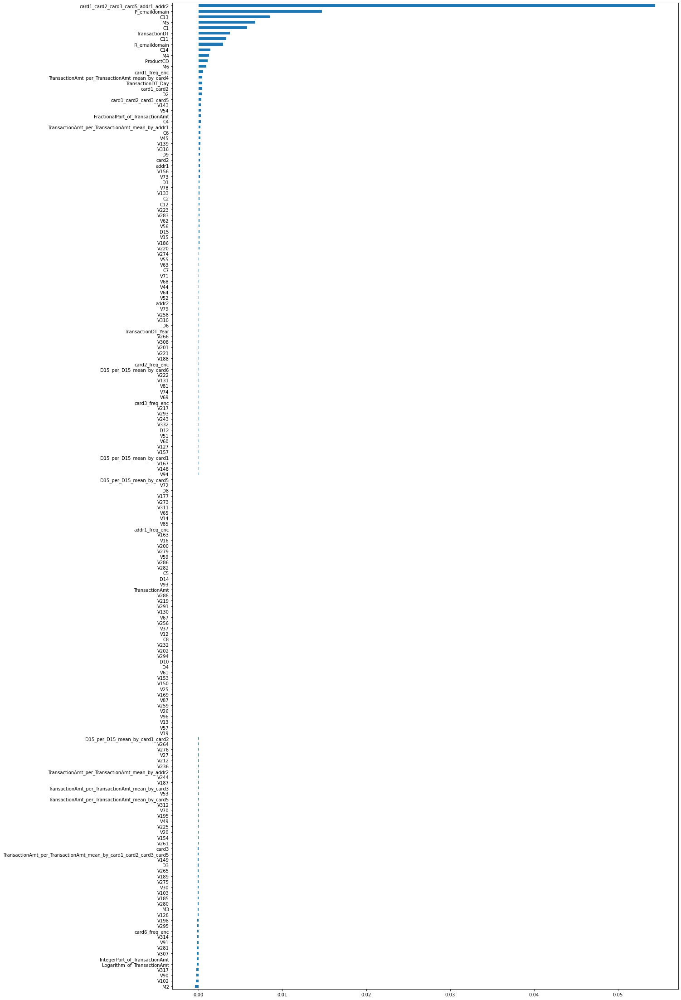

In [22]:
perm_importance.sort_values(ascending=True, inplace=True)
perm_importance[abs(perm_importance)>=0.00002].plot(kind='barh', figsize=(20, 40));

In [23]:
PERM_IMPORTANCE_FEATS= perm_importance[abs(perm_importance)>=0.00002].index.tolist()

In [24]:
train[PERM_IMPORTANCE_FEATS].shape

(180000, 179)

In [25]:
CAT_FEATS = train[PERM_IMPORTANCE_FEATS].dtypes[train[PERM_IMPORTANCE_FEATS].dtypes=="object"].index.tolist()
print(f"Categorical Features Count: {len(CAT_FEATS)}")

Categorical Features Count: 15


In [26]:
model_cb_3 = catboost_hold_out_validation(params=params_cb,
                                                        X=train[PERM_IMPORTANCE_FEATS],
                                                        y=y,
                                                        split_params =[0.7, 0.3],
                                                        categorical = CAT_FEATS,
                                                        seed=seed)


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0:	test: 0.7091195	test1: 0.6968540	best: 0.6968540 (0)	total: 690ms	remaining: 22m 58s
100:	test: 0.9630135	test1: 0.9165755	best: 0.9165755 (100)	total: 1m 2s	remaining: 19m 37s
200:	test: 0.9736640	test1: 0.9305535	best: 0.9305535 (200)	total: 2m 7s	remaining: 18m 58s
300:	test: 0.9791968	test1: 0.9389339	best: 0.9389339 (300)	total: 3m 14s	remaining: 18m 15s
400:	test: 0.9804643	test1: 0.9416892	best: 0.9416894 (399)	total: 4m 19s	remaining: 17m 15s
500:	test: 0.9812760	test1: 0.9427170	best: 0.9427170 (500)	total: 5m 24s	remaining: 16m 9s
600:	test: 0.9819876	test1: 0.9436302	best: 0.9436302 (600)	total: 6m 27s	remaining: 15m 2s
700:	test: 0.9825357	test1: 0.9442145	best: 0.9442192 (696)	total: 7m 31s	remaining: 13m 57s
800:	test: 0.9834520	test1: 0.9454964	best: 0.9454964 (800)	total: 8m 37s	remaining: 12m 54s
900:	test: 0.9839915	test1: 0.9458956	best: 0.9459013 (878)	total: 9m 41s	remaining: 11m 49s
1000:	test: 0.9842611	test1: 0.9463233	best: 0.9463233 (1000)	total: 10m 45s	re

**Итого:** 
* Valid Score = 0.9471 - базовое качество модели на валидационной выборке.
* Valid Score = 0.9506 - качество модели на валидационной выборке , построенной на 176 наиболее важных признаках, реализованных посредством permutation_importance, что близко к 0.9507 - качеству модели, построенной на 180 наиболее важных признаках, реализованных встроенным методом.

## Задание 4: 
* использовать BoostARoota для отбора признаков (настраивать или нет - на ваше усмотрение), переобучить модель и оценить изменение качества.

In [27]:
#!pip install boostaroota --user

In [28]:
from boostaroota import BoostARoota
import xgboost as xgb

In [29]:
def prepare_data(X: pd.DataFrame) -> pd.DataFrame:
    """
    Подготовка набора данных для моделирования.
    Категориальные признаки преобразуются с помощью
    OneHotEnconding.

    Parameters
    ----------
    X: pandas.core.frame.DataFrame
        Матрица признаков.

    Returns
    -------
    X_transformed: pandas.core.frame.DataFrame
        Преобразованная матрица признаков.

    """
    categorical = X.dtypes[X.dtypes=="object"].index.tolist()

    X = pd.get_dummies(X, columns=categorical)
    X.columns = [col.lower() for col in X.columns]
    
    return X

In [30]:
# 4 Гб оказалось невозможным разместить, поэтому уменьшаем размер выборки до 10000 строк
data = prepare_data(train.sample(10000))
data.head()

,transactionid,isfraud,transactiondt,transactionamt,dist1,dist2,c1,c2,c3,c4,c5,c6,c7,c8,c9,c10,c11,c12,c13,c14,d1,d2,d3,d4,d5,d6,d7,d8,d9,d10,d11,d12,d13,d14,d15,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v16,v17,v18,v19,v20,v21,v22,v23,v24,v25,v26,v27,v28,v29,v30,v31,v32,v33,v34,v35,v36,v37,v38,v39,v40,v41,v42,v43,v44,v45,v46,v47,v48,v49,v50,v51,v52,v53,v54,v55,v56,v57,v58,v59,v60,v61,v62,v63,v64,v65,v66,v67,v68,v69,v70,v71,v72,v73,v74,v75,v76,v77,v78,v79,v80,v81,v82,v83,v84,v85,v86,v87,v88,v89,v90,v91,v92,v93,v94,v95,v96,v97,v98,v99,v100,v101,v102,v103,v104,v105,v106,v107,v108,v109,v110,v111,v112,v113,v114,v115,v116,v117,v118,v119,v120,v121,v122,v123,v124,v125,v126,v127,v128,v129,v130,v131,v132,v133,v134,v135,v136,v137,v138,v139,v140,v141,v142,v143,v144,v145,v146,v147,v148,v149,v150,v151,v152,v153,v154,v155,v156,v157,v158,v159,v160,v161,v162,v163,v164,v165,v166,v167,v168,v169,v170,v171,v172,v173,v174,v175,v176,v177,v178,v179,v180,v181,v182,v183,v184,v185,v186,v187,v188,v189,v190,v191,v192,v193,v194,v195,v196,v197,v198,v199,v200,v201,v202,v203,v204,v205,v206,v207,v208,v209,v210,v211,v212,v213,v214,v215,v216,v217,v218,v219,v220,v221,v222,v223,v224,v225,v226,v227,v228,v229,v230,v231,v232,v233,v234,v235,v236,v237,v238,v239,v240,v241,v242,v243,v244,v245,v246,v247,v248,v249,v250,v251,v252,v253,v254,v255,v256,v257,v258,v259,v260,v261,v262,v263,v264,v265,v266,v267,v268,v269,v270,v271,v272,v273,v274,v275,v276,v277,v278,v279,v280,v281,v282,v283,v284,v285,v286,v287,v288,v289,v290,v291,v292,v293,v294,v295,v296,v297,v298,v299,v300,v301,v302,v303,v304,v305,v306,v307,v308,v309,v310,v311,v312,v313,v314,v315,v316,v317,v318,v319,v320,v321,v322,v323,v324,v325,v326,v327,v328,v329,v330,v331,v332,v333,v334,v335,v336,v337,v338,v339,transactiondt_year,transactiondt_month,transactiondt_weekday,transactiondt_hour,transactiondt_day,card1_freq_enc,card2_freq_enc,card3_freq_enc,card4_freq_enc,card5_freq_enc,card6_freq_enc,addr1_freq_enc,addr2_freq_enc,transactionamt_per_transactionamt_mean_by_card1,transactionamt_per_transactionamt_mean_by_card2,transactionamt_per_transactionamt_mean_by_card3,transactionamt_per_transactionamt_mean_by_card4,transactionamt_per_transactionamt_mean_by_card5,transactionamt_per_transactionamt_mean_by_card6,transactionamt_per_transactionamt_mean_by_addr1,transactionamt_per_transactionamt_mean_by_addr2,transactionamt_per_transactionamt_mean_by_card1_card2,transactionamt_per_transactionamt_mean_by_card1_card2_card3_card5,transactionamt_per_transactionamt_mean_by_card1_card2_card3_card5_addr1_addr2,d15_per_d15_mean_by_card1,d15_per_d15_mean_by_card2,d15_per_d15_mean_by_card3,d15_per_d15_mean_by_card4,d15_per_d15_mean_by_card5,d15_per_d15_mean_by_card6,d15_per_d15_mean_by_addr1,d15_per_d15_mean_by_addr2,d15_per_d15_mean_by_card1_card2,d15_per_d15_mean_by_card1_card2_card3_card5,d15_per_d15_mean_by_card1_card2_card3_card5_addr1_addr2,integerpart_of_transactionamt,fractionalpart_of_transactionamt,logarithm_of_transactionamt,productcd_c,productcd_h,productcd_r,productcd_s,productcd_w,card1_10004,card1_10007,card1_10009,card1_10017,card1_10019,card1_10023,card1_10024,card1_10027,card1_10035,card1_10036,card1_10043,card1_10045,card1_10047,card1_10049,card1_10057,card1_10063,card1_10065,card1_10069,card1_10075,card1_10086,card1_10094,card1_10102,card1_10107,card1_10112,card1_10113,card1_10120,card1_10142,card1_10145,card1_10165,card1_10179,card1_10186,card1_10199,card1_10209,card1_10210,card1_10216,card1_10222,card1_10225,card1_10230,card1_10234,card1_10251,card1_10258,card1_10262,card1_10267,card1_10269,card1_1027,card1_1028,card1_10282,card1_10291,card1_1030,card1_10313,card1_10321,card1_10349,card1_10359,card1_10370,card1_10372,card1_10385,card1_1039,card1_10391,card1_10398,card1_10409,card1_10414,card1_10431,card1_10445,card1_10447,card1_10454,card1_10461,card1_10471,card1_10476,card1_10480,card1_10486,card1_10487,card1_10493,card1_10501,card1_10505,card1_10509,card1_10512,card1_10518,card1_10519,card1_10537,card1_10545,card

In [31]:
x_train_xgb, x_valid_xgb = train_test_split(
    data.drop(['isfraud', 'transactionid'], axis=1), train_size=0.7, random_state=seed
)
y_train_xgb, y_valid_xgb = train_test_split(
    data['isfraud'], train_size=0.7, random_state=seed
)

### Base XGBoost

In [32]:
params_xgb = {
    "eta": 0.01,
    "objective": "binary:logistic",
    "subsample": 0.5,
    "base_score": np.mean(y_train_xgb),
    "eval_metric": "auc"
}

dtrain = xgb.DMatrix(x_train_xgb, label=y_train_xgb)
dvalid = xgb.DMatrix(x_valid_xgb, label=y_valid_xgb)

In [33]:
%%time

model_xgb = xgb.train(
    params_xgb,
    dtrain,
    num_boost_round=5000,
    evals=[(dtrain, "train"), (dvalid, "valid")],
    early_stopping_rounds=50,
    verbose_eval=100
)

[0]	train-auc:0.80182	valid-auc:0.70121
[100]	train-auc:0.95934	valid-auc:0.81308
[200]	train-auc:0.97832	valid-auc:0.83558
[300]	train-auc:0.98808	valid-auc:0.84389
[400]	train-auc:0.99429	valid-auc:0.84722
[500]	train-auc:0.99720	valid-auc:0.85323
[600]	train-auc:0.99855	valid-auc:0.85599
[700]	train-auc:0.99928	valid-auc:0.85604
[711]	train-auc:0.99936	valid-auc:0.85602
Wall time: 21min 56s


### Base BoostARoota¶

In [34]:
br = BoostARoota(metric='auc')
br.fit(x_train_xgb, y_train_xgb)

[14:58:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  1  iteration:  1
[14:59:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  1  iteration:  2
[14:59:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "sil

Round:  2  iteration:  9
[15:07:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  2  iteration:  10
[15:07:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  3  iteration:  1
[15:07:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.c

In [35]:
br.keep_vars_

0                                          transactiondt
1                                         transactionamt
2                                                  dist1
3                                                  dist2
4                                                     c1
5                                                     c2
6                                                     c4
7                                                     c5
8                                                     c7
9                                                     c8
10                                                   c10
11                                                   c11
12                                                   c13
13                                                   c14
14                                                    d1
15                                                    d2
16                                                    d3
17                             

In [36]:
x_train_br = br.transform(x_train_xgb)
x_valid_br = br.transform(x_valid_xgb)

dtrain_br = xgb.DMatrix(x_train_br, label=y_train_xgb)
dvalid_br = xgb.DMatrix(x_valid_br, label=y_valid_xgb)

In [37]:
model_br = xgb.train(
    params_xgb,
    dtrain_br,
    num_boost_round=5000,
    evals=[(dtrain_br, "train"), (dvalid_br, "valid")],
    early_stopping_rounds=50,
    verbose_eval=100
)

[0]	train-auc:0.80085	valid-auc:0.69809
[100]	train-auc:0.95330	valid-auc:0.80949
[200]	train-auc:0.97103	valid-auc:0.82602
[300]	train-auc:0.98311	valid-auc:0.83670
[400]	train-auc:0.98990	valid-auc:0.84566
[500]	train-auc:0.99395	valid-auc:0.84895
[600]	train-auc:0.99645	valid-auc:0.85262
[660]	train-auc:0.99742	valid-auc:0.85287


In [38]:
old_preds = model_xgb.predict(dvalid)
new_preds = model_br.predict(dvalid_br)

old_score = roc_auc_score(y_valid_xgb, old_preds)
new_score = roc_auc_score(y_valid_xgb, new_preds)
print(f"Base XGBoost score = {round(old_score, 5)}")
print(f"Base BoostARoota score = {round(new_score, 5)}")

Base XGBoost score = 0.85605
Base BoostARoota score = 0.85287


### Optimize BoostARoota

In [39]:
br = BoostARoota(metric='auc', iters=50)
br.fit(x_train_xgb, y_train_xgb)

[15:07:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  1  iteration:  1
[15:08:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  1  iteration:  2
[15:09:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "sil

Round:  1  iteration:  19
[15:25:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  1  iteration:  20
[15:26:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  1  iteration:  21
[15:27:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner

Round:  1  iteration:  38
[15:42:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  1  iteration:  39
[15:43:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  1  iteration:  40
[15:44:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner

Round:  2  iteration:  7
[15:52:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  2  iteration:  8
[15:52:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  2  iteration:  9
[15:52:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc

Round:  2  iteration:  26
[15:52:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  2  iteration:  27
[15:53:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  2  iteration:  28
[15:53:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner

Round:  2  iteration:  45
[15:53:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  2  iteration:  46
[15:53:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  2  iteration:  47
[15:53:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner

Round:  3  iteration:  14
[15:53:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  3  iteration:  15
[15:53:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  3  iteration:  16
[15:53:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner

Round:  3  iteration:  33
[15:53:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  3  iteration:  34
[15:53:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  3  iteration:  35
[15:53:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner

Round:  4  iteration:  2
[15:54:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  4  iteration:  3
[15:54:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  4  iteration:  4
[15:54:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc

Round:  4  iteration:  21
[15:54:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  4  iteration:  22
[15:54:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  4  iteration:  23
[15:54:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner

Round:  4  iteration:  40
[15:54:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  4  iteration:  41
[15:54:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Round:  4  iteration:  42
[15:54:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner

In [40]:
x_train_br = br.transform(x_train_xgb)
x_valid_br = br.transform(x_valid_xgb)

dtrain_br = xgb.DMatrix(x_train_br, label=y_train_xgb)
dvalid_br = xgb.DMatrix(x_valid_br, label=y_valid_xgb)

In [41]:
model_br = xgb.train(
    params_xgb,
    dtrain_br,
    num_boost_round=5000,
    evals=[(dtrain_br, "train"), (dvalid_br, "valid")],
    early_stopping_rounds=50,
    verbose_eval=100
)

[0]	train-auc:0.80182	valid-auc:0.70121
[100]	train-auc:0.95919	valid-auc:0.81254
[200]	train-auc:0.97753	valid-auc:0.82259
[300]	train-auc:0.98792	valid-auc:0.83519
[400]	train-auc:0.99425	valid-auc:0.84037
[500]	train-auc:0.99719	valid-auc:0.84542
[600]	train-auc:0.99863	valid-auc:0.84821
[700]	train-auc:0.99933	valid-auc:0.85036
[800]	train-auc:0.99975	valid-auc:0.85204
[900]	train-auc:0.99987	valid-auc:0.85406
[1000]	train-auc:0.99994	valid-auc:0.85537
[1051]	train-auc:0.99997	valid-auc:0.85532


In [42]:
old_preds = model_xgb.predict(dvalid)
new_preds = model_br.predict(dvalid_br)

old_score = roc_auc_score(y_valid_xgb, old_preds)
new_score = roc_auc_score(y_valid_xgb, new_preds)
print(f"Base XGBoost score = {round(old_score, 5)}")
print(f"Base BoostARoota score = {round(new_score, 5)}")

Base XGBoost score = 0.85605
Base BoostARoota score = 0.85537


**Итого:**

* На рассматриваемой выборке применение BoostARoota для отбора признаков не дает улучшения качества.

## Задание 5: 
* использовать shap, выполнить задание 1 и 2.

In [43]:
explainer = shap.TreeExplainer(model_cb_0)
shap_values = explainer.shap_values(X_valid, y_valid)

In [44]:
vals = np.abs(shap_values).mean(0)
shap_feature_importance = pd.DataFrame(list(zip(X.columns,vals)),columns=['feature','shap_values'])
shap_feature_importance.sort_values(by=['shap_values'],ascending=False,inplace=True)

shap_feature_importance[:180]

,feature,shap_values
399,card1_card2_card3_card5_addr1_addr2,0.207747
27,C13,0.201649
15,C1,0.119104
13,P_emaildomain,0.115665
28,C14,0.103367
48,M5,0.095879
25,C11,0.088887
0,TransactionDT,0.077543
431,FractionalPart_of_TransactionAmt,0.052743
14,R_emaildomain,0.048743


In [45]:
SHAP_FEATS = shap_feature_importance["feature"].values.tolist()[:180]
SHAP_FEATS

['card1_card2_card3_card5_addr1_addr2',
 'C13',
 'C1',
 'P_emaildomain',
 'C14',
 'M5',
 'C11',
 'TransactionDT',
 'FractionalPart_of_TransactionAmt',
 'R_emaildomain',
 'TransactionDT_Day',
 'V294',
 'ProductCD',
 'TransactionDT_Hour',
 'TransactionAmt_per_TransactionAmt_mean_by_addr1',
 'V308',
 'D2',
 'card6_freq_enc',
 'Logarithm_of_TransactionAmt',
 'card2',
 'V143',
 'IntegerPart_of_TransactionAmt',
 'card1_freq_enc',
 'V307',
 'M4',
 'card1_card2_card3_card5',
 'V90',
 'V29',
 'C2',
 'C4',
 'TransactionAmt_per_TransactionAmt_mean_by_card4',
 'TransactionAmt_per_TransactionAmt_mean_by_addr2',
 'card6',
 'V102',
 'V280',
 'TransactionAmt_per_TransactionAmt_mean_by_card3',
 'D1',
 'addr1',
 'D8',
 'TransactionAmt',
 'M3',
 'V54',
 'M6',
 'V49',
 'V91',
 'C8',
 'V103',
 'C12',
 'M2',
 'V185',
 'D15_per_D15_mean_by_card6',
 'D15',
 'V133',
 'card3',
 'C7',
 'addr2',
 'V189',
 'V67',
 'V30',
 'V186',
 'card1_card2',
 'V316',
 'V281',
 'V69',
 'V45',
 'C6',
 'TransactionAmt_per_Transac

In [46]:
train[SHAP_FEATS].shape

(180000, 180)

In [47]:
CAT_FEATS = train[SHAP_FEATS].dtypes[train[SHAP_FEATS].dtypes=="object"].index.tolist()
print(f"Categorical Features Count: {len(CAT_FEATS)}")

Categorical Features Count: 16


In [48]:
model_cb_5 = catboost_hold_out_validation(params=params_cb,
                                                        X=train[SHAP_FEATS],
                                                        y=y,
                                                        split_params =[0.7, 0.3],
                                                        categorical = CAT_FEATS,
                                                        seed=seed)


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0:	test: 0.6004756	test1: 0.5933981	best: 0.5933981 (0)	total: 603ms	remaining: 20m 6s
100:	test: 0.9631469	test1: 0.9157572	best: 0.9157572 (100)	total: 1m 5s	remaining: 20m 36s
200:	test: 0.9713112	test1: 0.9284696	best: 0.9284696 (200)	total: 2m 13s	remaining: 19m 54s
300:	test: 0.9776254	test1: 0.9383416	best: 0.9383416 (300)	total: 3m 22s	remaining: 19m 5s
400:	test: 0.9798069	test1: 0.9420128	best: 0.9420128 (400)	total: 4m 31s	remaining: 18m 3s
500:	test: 0.9806265	test1: 0.9432502	best: 0.9432694 (494)	total: 5m 38s	remaining: 16m 52s
600:	test: 0.9815403	test1: 0.9443594	best: 0.9443594 (600)	total: 6m 46s	remaining: 15m 45s
700:	test: 0.9820885	test1: 0.9451432	best: 0.9451468 (698)	total: 7m 52s	remaining: 14m 35s
800:	test: 0.9826266	test1: 0.9457311	best: 0.9457352 (798)	total: 9m	remaining: 13m 28s
900:	test: 0.9831668	test1: 0.9464511	best: 0.9464568 (897)	total: 10m 7s	remaining: 12m 21s
1000:	test: 0.9838060	test1: 0.9470290	best: 0.9470326 (997)	total: 11m 16s	remaini

**Итого:** 
* Valid Score = 0.9471 - базовое качество модели на валидационной выборке.
* Valid Score = 0.9506 - качество модели на валидационной выборке , построенной на 180 наиболее важных признаках, реализованных посредством SHAP, что эквивалентно качеству модели, постороенной с применением permutaion importance, и близко к 0.9507 - качеству модели, построенной на 180 наиболее важных признаках, реализованных встроенным методом.

## Задание 6: 
* построить shap.summary_plot и shap.decision_plot для небольшой группы примеров (определить размер самостоятельно) и проанализировать влияние признаков на поведение модели.

In [49]:
X_valid_, y_valid_ = X_valid.sample(2000), y_valid.sample(2000)

explainer = shap.TreeExplainer(model_cb_0)
shap_values = explainer.shap_values(X_valid_, y_valid_)

Можно объяснить предсказаниях для конкретных наблюдений валидационной выборки.

In [50]:
shap.force_plot(
    explainer.expected_value, shap_values[0,:], X_valid_.iloc[0,:], link="logit"
)

In [94]:
shap.force_plot(
    explainer.expected_value, shap_values[100,:], X_valid_.iloc[100,:], link="logit"
)

Выше приведены диаграммы оценки степени влияния разных предикторов на целевую переменную для двух конкретных наблюдений:
1. Прогноз составляет:
* 0.01 - для первого наблюдения ,
* 0.03 - для второго наблюдения 
2. Признаки, которые увеличивают прогноз, отображаются красным цветом, а признаки, толкающие прогноз ниже, синим цветом.  

Наибольший позитивный вклад в прогноз вносят признаки:
* `C13`, `M5` - для первого наблюдения
* `C14`, `C13` - для второго наблюдения

Наибольший негативный вклад в прогноз вносят признаки:
* `card1_card2_card3_card5_addr1_addr2` - для первого наблюдения
* `P_emaildomain` - для второго наблюдения

### Гистограмма важности признаков

Берется среднее значение величин SHAP по набору данных и отображает его в виде простой столбчатой диаграммы.

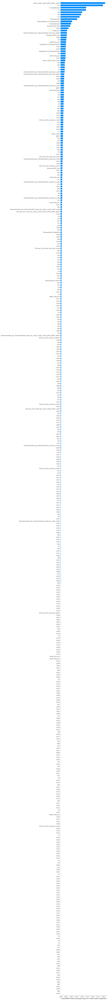

In [51]:
shap.summary_plot(shap_values, X_valid_, plot_type="bar", max_display=X_valid_.shape[1])

###  Диаграмма разброса плотности значений `SHAP` для каждого признака

Самым большим отличием диаграммы разброса плотности значений `SHAP` для каждого признака от диаграммы важности (см. выше) является то, что он показывает положительные и отрицательные отношения признаков с целевой переменной. 

* Признаки ранжируются в порядке убывания важности.
* Горизонтальное расположение показывает связь значения признака с более высоким или низким прогнозом,
* Цвет показывает, является ли этот признак высоким (красным) или низким (синим) для данного наблюдения.

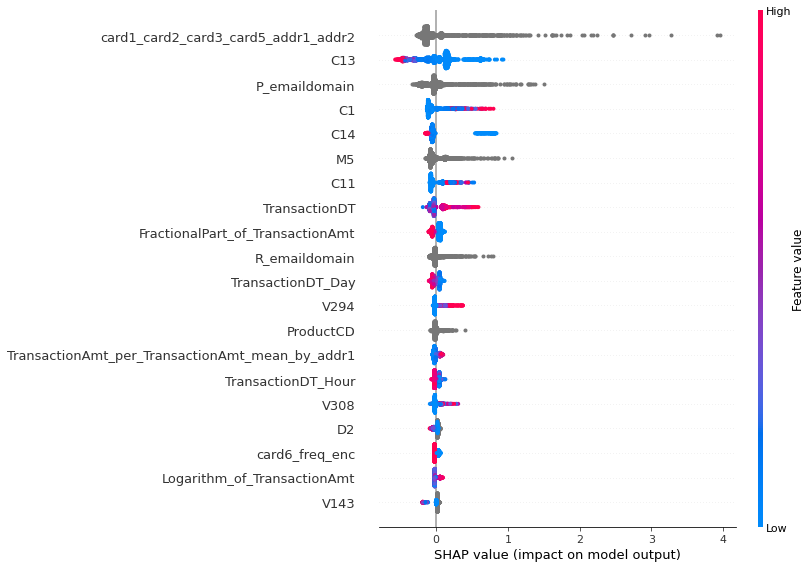

In [95]:
shap.summary_plot(shap_values, X_valid_, max_display=20)

### SHAP Dependence Plots

`SHAP Dependence Plots` показывают влияние одного признака на весь набор данных. Они отображают значение функции по сравнению с SHAP-значениями этого признака на многих наблюдениях. `SHAP Dependence Plots` учитывают эффекты взаимодействия, присутствующие в признаках, и определяются только в областях входного пространства, поддерживаемых данными. Вертикальный разброс SHAP-values для одного признака определяется эффектами взаимодействия, и для выделения возможных взаимодействий выбирается другой признак.

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
Passing the fontdict parameter of _set_ticklabels() positionally is deprecated since Matplotlib 3.3; the parameter will become keyword-only two minor releases later.


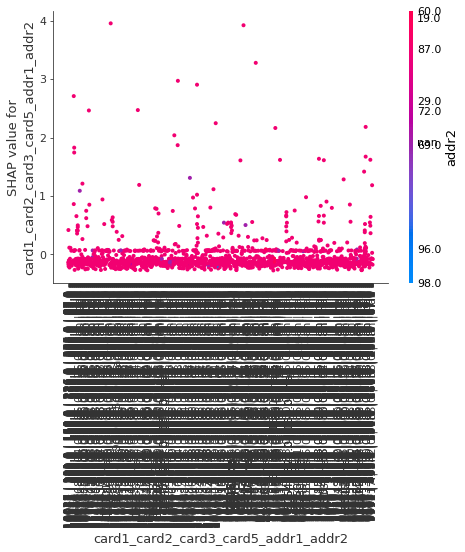

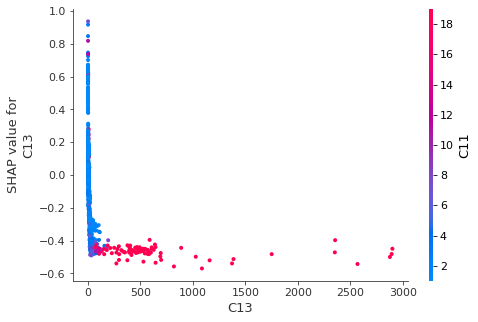

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


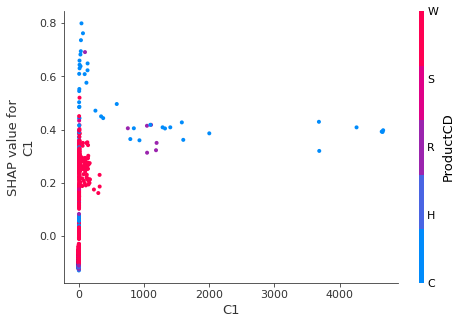

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
Passing the fontdict parameter of _set_ticklabels() positionally is deprecated since Matplotlib 3.3; the parameter will become keyword-only two minor releases later.


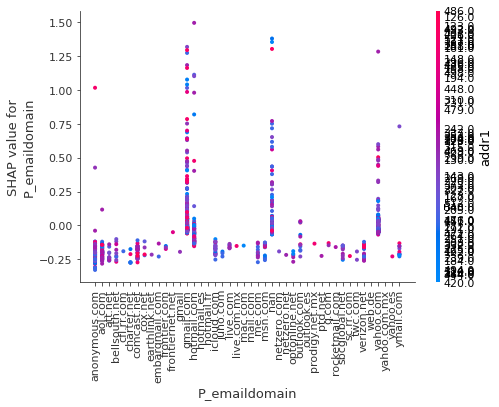

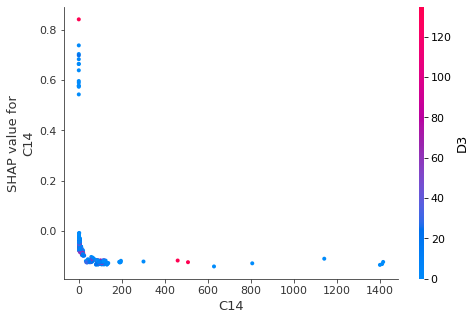

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
Passing the fontdict parameter of _set_ticklabels() positionally is deprecated since Matplotlib 3.3; the parameter will become keyword-only two minor releases later.


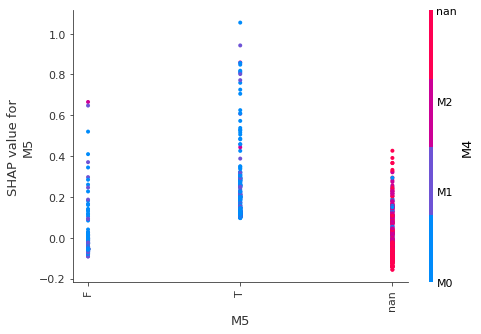

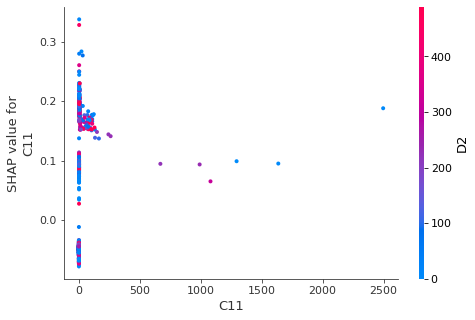

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


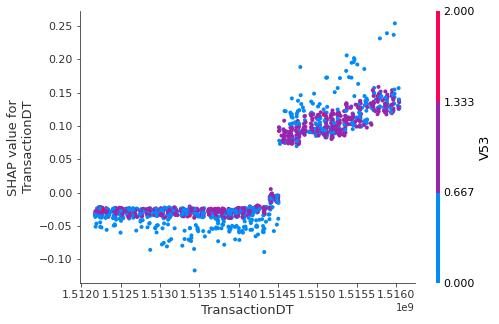

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


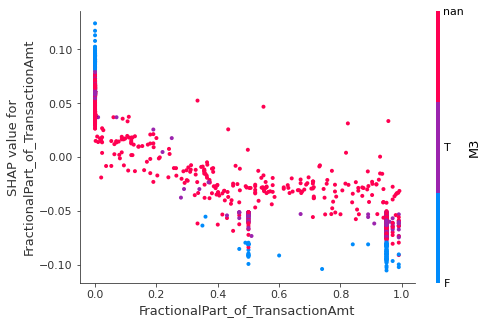

Passing the fontdict parameter of _set_ticklabels() positionally is deprecated since Matplotlib 3.3; the parameter will become keyword-only two minor releases later.


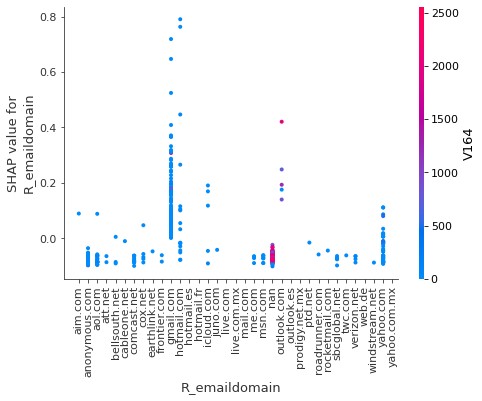

In [53]:
dependence_features = [
    'card1_card2_card3_card5_addr1_addr2',
    'C13', 
    'C1',
    'P_emaildomain',
    'C14',
    'M5',
    'C11',
    'TransactionDT',
    'FractionalPart_of_TransactionAmt',
    'R_emaildomain',
]
for name in dependence_features:
    shap.dependence_plot(name, shap_values, X_valid_, display_features=X_valid_)

### Basic decision plot features

* ось __`x`__ представляет результат работы модели. В этом случае единицы являются `log-odds`.


* ось __`y`__ показывает признаки модели. По умолчанию, признаки упорядочены по убыванию важности. Важность рассчитывается по нанесенным на график наблюдениям. Обычно, такой расчет отличается от порядка важности признаков для всего набора данных.


* Прогноз каждого наблюдения представлен цветной линией. Вверху графика каждая линия пересекает ось абсцисс на уровне предсказанного значения соответствующего наблюдения. Это значение определяет цвет линии на спектре.


* При перемещении снизу графика вверх, значения SHAP для каждого объекта добавляются к базовому значению модели. Это показывает, как каждый признак способствует общему прогнозу.

In [57]:
expected_value = explainer.expected_value
if isinstance(expected_value, list):
    expected_value = expected_value[1]
print(f"Explainer expected value: {expected_value}")

Explainer expected value: -4.723984881381128


In [77]:
select = range(25)
features = X_valid_.iloc[select]
features_display = X_valid_.loc[features.index]
shap_values = explainer.shap_values(features)

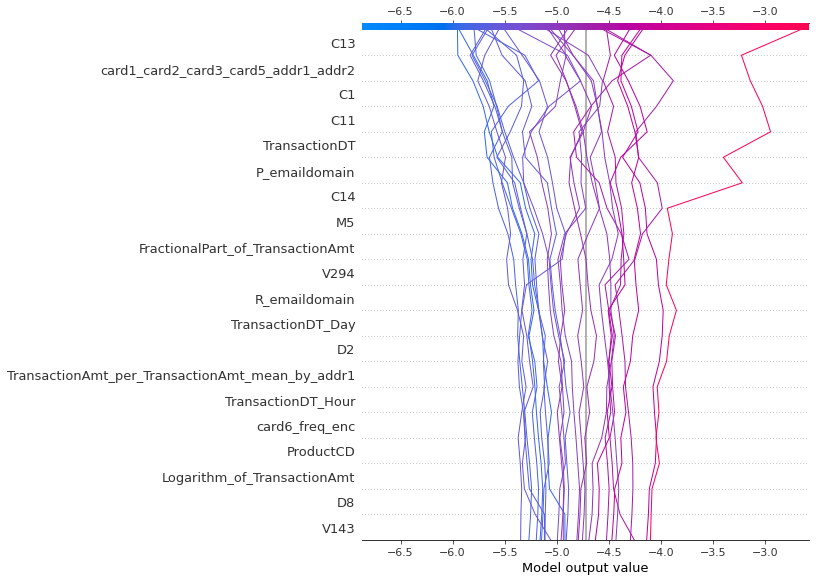

In [78]:
shap.decision_plot(
    expected_value, shap_values, features_display.iloc[:25]
)

График поддерживает link = 'logit'для преобразования логарифмических шансов в вероятности.

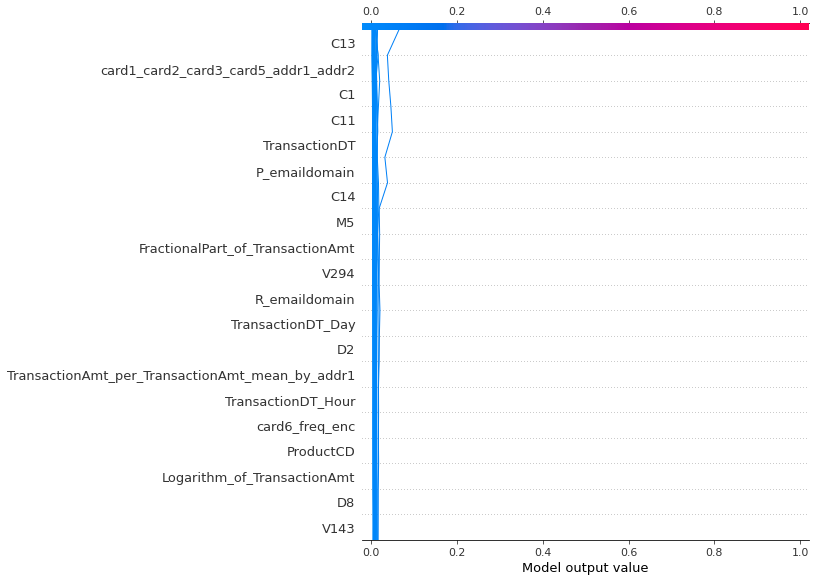

In [79]:
shap.decision_plot(explainer.expected_value, shap_values, features_display.iloc[:25], link="logit")

Наблюдения можно выделить с помощью пунктирной линии. Выделим неверно классифицированное наблюдение.

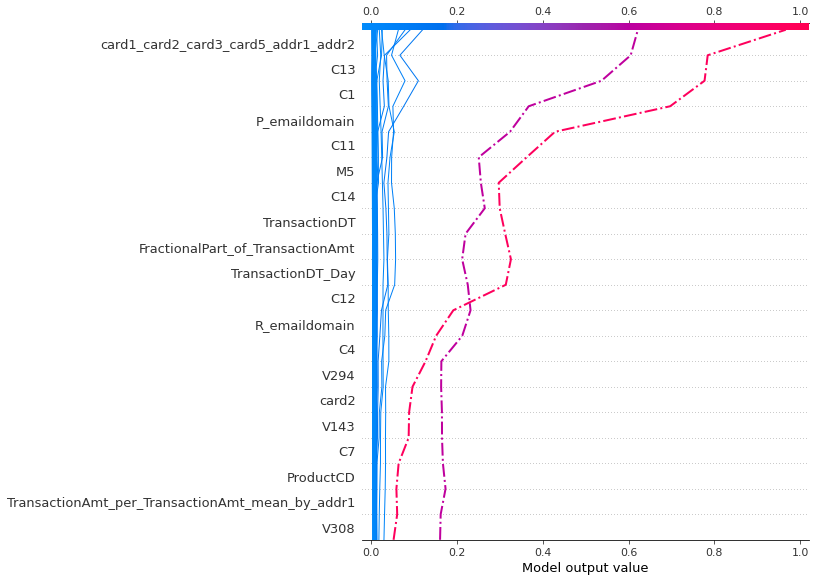

In [80]:
shap_values = explainer.shap_values(X_valid_, y_valid_)
y_pred = (shap_values.sum(1) + explainer.expected_value) > 0

misclassified = y_pred != y_valid_
shap.decision_plot(
    explainer.expected_value, shap_values[200:250], features_display.iloc[200:250],
    link='logit', highlight=misclassified[200:250]
)

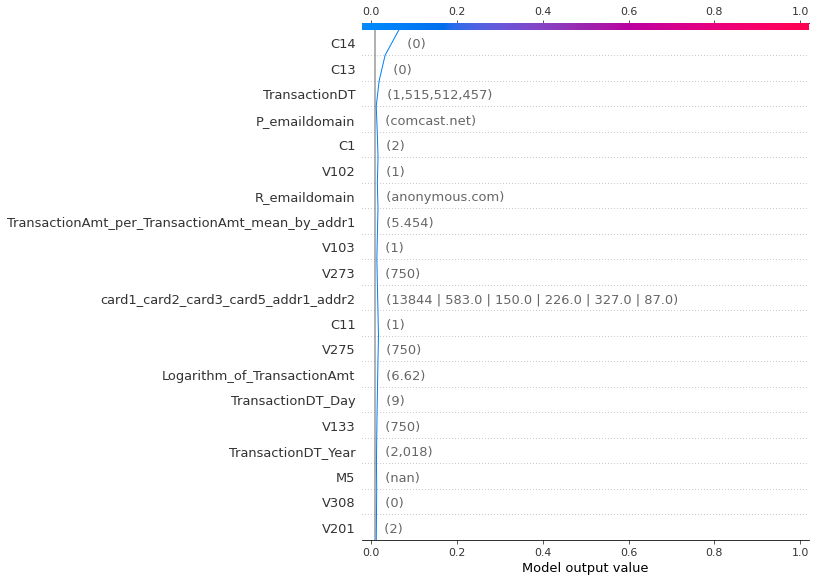

In [81]:
shap.decision_plot(
    explainer.expected_value, shap_values[15], features_display.iloc[15], link='logit', highlight=misclassified.iloc[15]
)

### Выделение аномалий

`decision_plot` могут помочь выявить выбросы, укажем `feature_order = 'hclust'`, чтобы сгруппировать наблюдения с похожими путями прогнозирования. Это часто упрощает выявление выбросов. Не будем использования `link = 'logit'` при построении выбросов, потому что предсказания амплитуды искажаются сигмоидой.

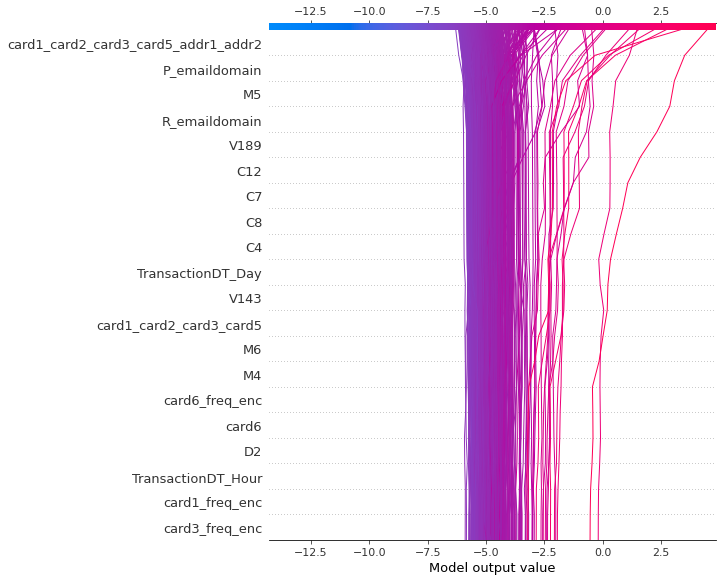

In [83]:
y_pred = model_cb_0.predict_proba(X_valid)
T = X_valid[(y_pred >= 0.5) & (y_pred <= 1)]
T = T.sample(500)

sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, feature_order='hclust', return_objects=True)